In [1]:
import cv2
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt
from utils import *
import os
from scipy import signal
from scipy.sparse import lil_matrix
from scipy.sparse.linalg import lsqr


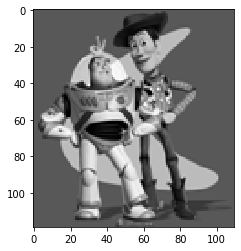

In [2]:
toy_img = cv2.cvtColor(cv2.imread('samples/toy_problem.png'), cv2.COLOR_BGR2RGB)
toy_img = cv2.cvtColor(toy_img, cv2.COLOR_BGR2GRAY).astype('double') / 255.0
plt.imshow(toy_img, cmap="gray")

In [3]:
def display_images(img_cnt, imgs, titles, datatypes):
    
    assert img_cnt == len(imgs)
    assert img_cnt == len(titles)
    assert img_cnt == len(datatypes)
        
    fig, axes = plt.subplots(1,img_cnt, figsize=(25,25))

    for i in range(img_cnt):
        axes[i].imshow(imgs[i].astype(datatypes[i]),cmap='gray') 
        axes[i].set_title(titles[i], fontsize=15)


## Part 1 Toy Problem (20 pts)

In [4]:
def toy_reconstruct(im):
    """
    The implementation for gradient domain processing is not complicated, but it is easy to make a mistake, so let's start with a toy example. Reconstruct this image from its gradient values, plus one pixel intensity. Denote the intensity of the source image at (x, y) as s(x,y) and the value to solve for as v(x,y). For each pixel, then, we have two objectives:
    1. minimize (v(x+1,y)-v(x,y) - (s(x+1,y)-s(x,y)))^2
    2. minimize (v(x,y+1)-v(x,y) - (s(x,y+1)-s(x,y)))^2
    Note that these could be solved while adding any constant value to v, so we will add one more objective:
    3. minimize (v(1,1)-s(1,1))^2
    
    :param im: numpy.ndarray
    """
    
    im_h, im_w = im.shape
    im2var = np.arange(im_h * im_w).reshape(im_h, im_w)
    
    matrix_size = (im_h)*(im_w-1) + (im_h-1)*(im_w) + 1
    
    A = lil_matrix((matrix_size, im_h * im_w)) 
    b = np.zeros((matrix_size))
    
    e = 0
    
    A[e, im2var[0][0]] = 1
    b[e] = im[0][0]
    
    for y in range(im_h): 
        for x in range(im_w):
            if (x + 1 < im_w):
                e += 1
                A[e, im2var[y][x+1]] = 1
                A[e, im2var[y][x]] = -1
                b[e] = im[y][x+1] - im[y][x]
            
            if (y + 1 < im_h):
                e += 1    
                A[e, im2var[y+1][x]] = 1
                A[e, im2var[y][x]] = -1
                b[e] = im[y+1][x] - im[y][x]
                
    print("No of equations: ", e)
    
    assert matrix_size == (e+1)
    
    var = lsqr(A.tocsr(), b)
    result = var[0].reshape(im_h, im_w)
          
    return result



No of equations:  25951
Error is:  0.00031701850071267805


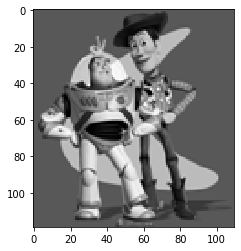

In [5]:
im_out = toy_reconstruct(toy_img)
if im_out.any():
    print("Error is: ", np.sqrt(((im_out - toy_img)**2).sum()))

plt.imshow(im_out,cmap='gray')


## Preparation

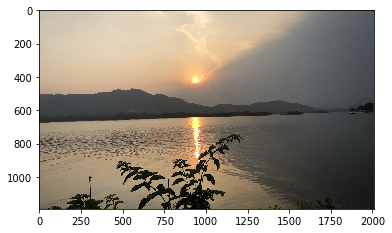

In [6]:
# Feel free to change image
#background_img_path = 'samples/im2.JPG'
#background_img_path = 'my_images/ManInTheSnow.jpg'
#background_img_path = 'my_images/AgraPalace.jpg'
#background_img_path = 'my_images/TexturedWall.jpg'
#background_img_path = 'my_images/WaterCreek.jpg'

background_img_path = 'my_images/Sunset.jpg'


background_img = cv2.cvtColor(cv2.imread(background_img_path), cv2.COLOR_BGR2RGB).astype('double') / 255.0 
plt.figure()
plt.imshow(background_img)

In [7]:
# Feel free to change image
#object_img_path = 'samples/penguin-chick.jpeg'
#object_img_path = 'samples/penguin.jpg'
#object_img_path = 'my_images/PenWriting.jpg'
#object_img_path = 'my_images/TigerInWater.jpg'
object_img_path = 'my_images/Boats.jpg'

object_img = cv2.cvtColor(cv2.imread(object_img_path), cv2.COLOR_BGR2RGB).astype('double') / 255.0 

If it doesn't get you to the drawing mode, then rerun this function again.


<IPython.core.display.Javascript object>


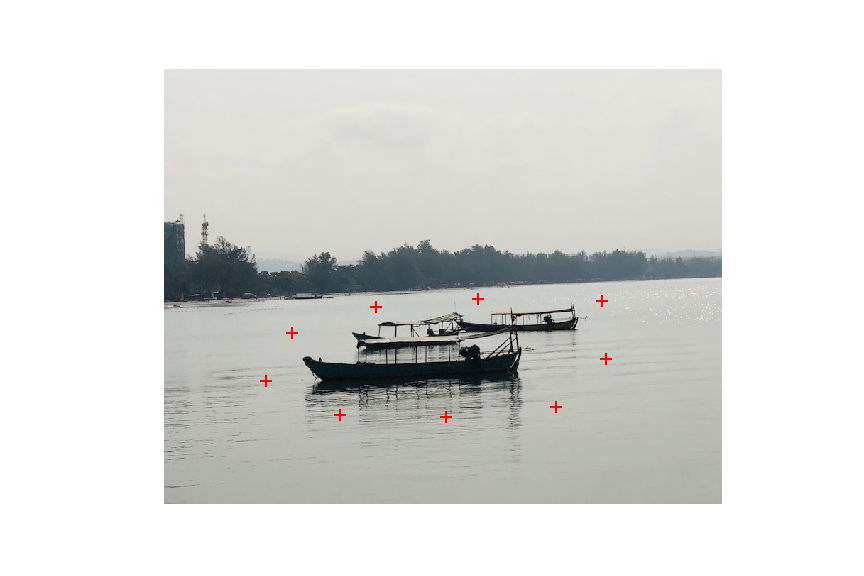

In [10]:
import matplotlib.pyplot as plt
%matplotlib notebook
mask_coords = specify_mask(object_img)

len(mask_coords):  4


<Figure size 432x288 with 0 Axes>

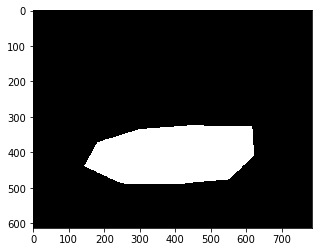

In [11]:
print("len(mask_coords): ", len(mask_coords))

xs = mask_coords[0]
ys = mask_coords[1]
%matplotlib inline
import matplotlib.pyplot as plt
plt.figure()
mask = get_mask(ys, xs, object_img)

If it doesn't get you to the drawing mode, then rerun this function again. Also, make sure the object fill fit into the background image. Otherwise it will crash


<IPython.core.display.Javascript object>


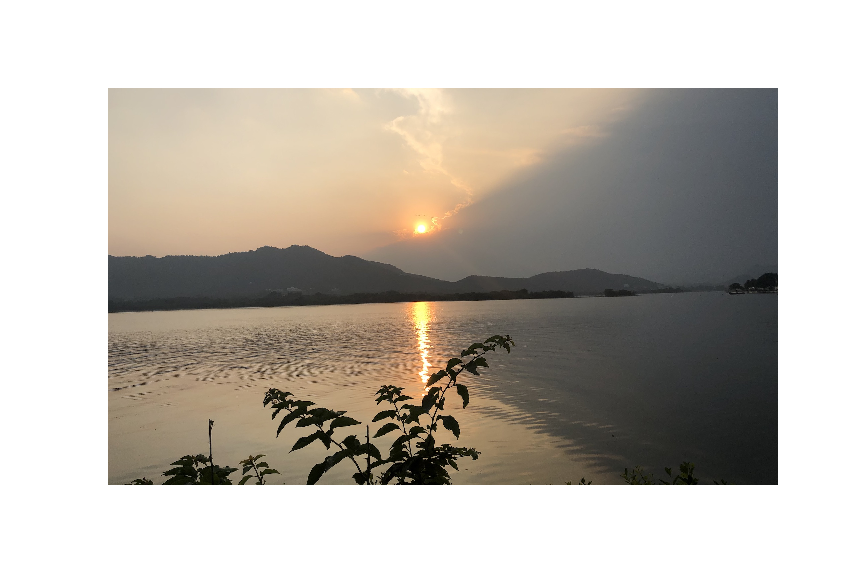

In [12]:
%matplotlib notebook
import matplotlib.pyplot as plt
bottom_center = specify_bottom_center(background_img)

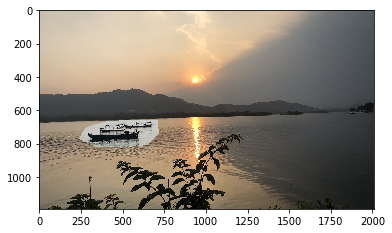

In [13]:
%matplotlib inline
import matplotlib.pyplot as plt
cropped_object, object_mask = align_source(object_img, mask, background_img, bottom_center)

## Part 2 Poisson Blending (50 pts)

In [239]:
def gaussian_kernel(sigma, kernel_half_size):
    '''
    Inputs:
        sigma = standard deviation for the gaussian kernel
        kernel_half_size = recommended to be at least 3*sigma

    Output:
        Returns a 2D Gaussian kernel matrix
    '''
    window_size = kernel_half_size * 2 + 1
    gaussian_kernel_1d = signal.gaussian(window_size, std=sigma).reshape(window_size, 1)
    gaussian_kernel_2d = np.outer(gaussian_kernel_1d, gaussian_kernel_1d)
    gaussian_kernel_2d /= np.sum(gaussian_kernel_2d)  # make sure it sums to one

    return gaussian_kernel_2d

def apply_filter(im, kernel):
    if(len(im.shape) > 2):
        H, W, D = im.shape
    else:
        H, W = im.shape
    hs = kernel.shape[0] // 2
    
    fftsize = 4096
    fft_intensity_image = np.fft.fft2(im, (fftsize, fftsize))
    fft_kernel = np.fft.fft2(kernel, (fftsize, fftsize))
    fft_filtered_image = fft_intensity_image * fft_kernel
    filtered_image = np.fft.ifft2(fft_filtered_image)
    if(len(im.shape) > 2):
        filtered_image = filtered_image[hs:hs + H, hs:hs + W, hs:hs + D]
    else:
        filtered_image = filtered_image[hs:hs + H, hs:hs + W]
    filtered_image = np.real(filtered_image)

    return filtered_image


def apply_gaussian_filter(im, size, sigma):
    low_pass_filtered = cv2.GaussianBlur(im, (size, size), sigma)

    return low_pass_filtered

def laplacian_filter(im, size, sigma):
    
    low_pass_filtered = apply_gaussian_filter(im, size, sigma)
    high_pass_filtered = np.subtract(im, low_pass_filtered)
    
    return high_pass_filtered

def apply_laplacian_filter(im, size, sigma):
    laplacian_filtered = np.zeros(im.shape, im.dtype)
    
    if(len(im.shape) > 2):
        im_r, im_g, im_b = cv2.split(im)
        filtered = np.zeros((3,im.shape[0],im.shape[1]), im.dtype)
        
        filtered[0] = laplacian_filter(im_r, size, sigma)
        filtered[1] = laplacian_filter(im_g, size, sigma)
        filtered[2] = laplacian_filter(im_b, size, sigma)
        laplacian_filtered = cv2.merge((filtered[0],filtered[1],filtered[2]))
    else:
        laplacian_filtered = laplacian_filter(im, size, sigma)
    
    #display_images(2, [im, laplacian_filtered], ['Original', 'High pass filtered'],['double','double'])
    
    return laplacian_filtered

In [15]:
def normalize_img(img):
    
    min_val = np.max(img)
    max_val = np.max(img)
    c = max_val / (1 + max_val)
    
    for y in range(img.shape[0]):
        for x in range(img.shape[1]):
            if (img[y][x] > 1.0):
                img[y][x] = 1.0
            if (img[y][x] < 0.0):
                img[y][x] = 0.0
                
    return img

In [16]:
def gradient_descent(src_img, mask, trgt_img):
    """
    The implementation for gradient domain processing is not complicated, but it is easy to make a mistake, so let's start with a toy example. Reconstruct this image from its gradient values, plus one pixel intensity. Denote the intensity of the source image at (x, y) as s(x,y) and the value to solve for as v(x,y). For each pixel, then, we have two objectives:
    1. minimize (v(x+1,y)-v(x,y) - (s(x+1,y)-s(x,y)))^2
    2. minimize (v(x,y+1)-v(x,y) - (s(x,y+1)-s(x,y)))^2
    3. minimize (v(x+1,y)-t(x,y) - (s(x+1,y)-s(x,y)))^2
    4. minimize (v(x,y+1)-t(x,y) - (s(x,y+1)-s(x,y)) )^2
    
    :param im: numpy.ndarray
    """
    #print("Src Max:", np.max(src_img), " Trgt Max: ", np.max(trgt_img))
    
    im_h, im_w = trgt_img.shape
    
    matrix_size = 2*((im_h)*(im_w-1) + (im_h-1)*(im_w))
    
    #print("Matrix size: ", matrix_size)
        
    A = lil_matrix((matrix_size, im_h * im_w)) 
    b = np.zeros((matrix_size))
    
    im2var = np.arange(im_h * im_w).reshape(im_h, im_w)
    
    e = -1
    
    for y in range(im_h): 
        for x in range(im_w):
            
            if (x + 1 < im_w):
                e += 1
                A[e, im2var[y][x+1]] = 1
                A[e, im2var[y][x]] = -1
                b[e] = src_img[y][x+1] - src_img[y][x]
             
                if(mask[y][x] == 0):
                    e += 1
                    A[e, im2var[y][x+1]] = -1
                    b[e] = -src_img[y][x+1] + src_img[y][x] - trgt_img[y][x]
             
            if (y + 1 < im_h):
                e += 1    
                A[e, im2var[y+1][x]] = 1
                A[e, im2var[y][x]] = - 1
                b[e] = src_img[y+1][x] - src_img[y][x] 
                
                if(mask[y][x] == 0):
                    e += 1
                    A[e, im2var[y+1][x]] = -1
                    b[e] = -src_img[y+1][x] + src_img[y][x] - trgt_img[y][x]
        
                
    #print("No of equations: ", e)
    
    #assert matrix_size > (e+1)
    
    var = lsqr(A.tocsr(), b)
    result = var[0].reshape(im_h, im_w)
   
    result = normalize_img(result)
    
    return result

In [17]:
def find_blending_region(mask, src_img_arr, trgt_img_arr):
    
    im_h, im_w = mask.shape
    
    last_blank = 0
    
    start_y = -1
    end_y = -1

    # Wait till the first blank row till next set of blank rows
    
    for y in range(im_h):
        mask_sum = np.sum(mask[y][:])
        
        if (mask_sum == 0):
            if (start_y != -1):
                #print("Mask Y startpoint recognised")
                if(last_blank + 1 == y):
                    end_y = y
                    #print("Last non blank row:", y)
                    break
                        
            last_blank = y

        else:
            if (start_y == -1):
                #print("First non blank row:", y)
                start_y = y
    
    if(start_y == -1):
        start_y = 0
    if (end_y == -1):
        end_y = im_h
        
    #print("start_y: ", start_y, " end_y: ", end_y)  
    
    last_blank = 0
    start_x = -1
    end_x = -1
    
    mask_T = np.transpose(mask)
    for x in range(im_w):
        mask_sum = np.sum(mask_T[x][:])
        
        if (mask_sum == 0):
            if (start_x != -1):
                #print("Mask X startpoint recognised")
                if(last_blank + 1 == x):
                    end_x = x
                    #print("Last non blank column:", x)
                    break
                        
            last_blank = x

        else:
            if (start_x == -1):
                #print("First non blank column:", x)
                start_x = x
    
    if(start_x == -1):
        start_x = 0
    if (end_x == -1):
        end_x = im_w
        
    #print("start_x: ", start_x, " end_x: ", end_x)
    
    new_h = end_y - start_y + 1
    new_w = end_x - start_x + 1
    
    new_mask = np.zeros((new_h, new_w))
    
    new_src_r = np.zeros((new_h, new_w))
    new_src_g = np.zeros((new_h, new_w))
    new_src_b = np.zeros((new_h, new_w))
    
    new_trgt_r = np.zeros((new_h, new_w))
    new_trgt_g = np.zeros((new_h, new_w))
    new_trgt_b = np.zeros((new_h, new_w))
    
   # print("Mask size: ", new_h, " X", new_w, " Shape: ", new_mask.shape, " Size: ", new_mask.size)
    
    y = start_y
    new_y = 0
    
    while(y < end_y):
        x = start_x
        new_x = 0
        while (x < end_x):
            new_mask[new_y][new_x] = mask[y][x]
            
            new_src_r[new_y][new_x] = src_img_arr[0][y][x]
            new_src_g[new_y][new_x] = src_img_arr[1][y][x]
            new_src_b[new_y][new_x] = src_img_arr[2][y][x]
            
            new_trgt_r[new_y][new_x] = trgt_img_arr[0][y][x]
            new_trgt_g[new_y][new_x] = trgt_img_arr[1][y][x]
            new_trgt_b[new_y][new_x] = trgt_img_arr[2][y][x]
            
            x += 1
            new_x += 1
            
        y += 1
        new_y += 1
    
    new_src = [new_src_r,new_src_g, new_src_b]
    new_trgt = [new_trgt_r, new_trgt_g, new_trgt_b]
    
    return start_y, end_y, start_x, end_x, new_mask, new_src, new_trgt

In [18]:
def poisson_blend(object_img, object_mask, background_img, grad_descent_func=gradient_descent):
    """
    :param cropped_object: numpy.ndarray One you get from align_source
    :param object_mask: numpy.ndarray One you get from align_source
    :param background_img: numpy.ndarray 
    """
    mask3d = np.zeros([object_mask.shape[0], object_mask.shape[1], 3])
    for i in range(3):
        mask3d[:,:, i] = object_mask 
    
    src_img =  object_img
    
    src_img_r, src_img_g, src_img_b = cv2.split(src_img)
    trgt_img_r, trgt_img_g, trgt_img_b = cv2.split(background_img)

    start_y, end_y, start_x, end_x, new_mask, new_src, new_trgt = find_blending_region(object_mask,\
                                                [src_img_r,src_img_g,src_img_b],\
                                                [trgt_img_r,trgt_img_g,trgt_img_b])
    

    blended_r = grad_descent_func(new_src[0], new_mask, new_trgt[0])
    blended_g = grad_descent_func(new_src[1], new_mask, new_trgt[1])
    blended_b = grad_descent_func(new_src[2], new_mask, new_trgt[2])
    interim_result = cv2.merge((blended_r, blended_g, blended_b))

    interim_src = cv2.merge((new_src))
    interim_trgt = cv2.merge((new_trgt))
   
    display_images(4, [ new_mask, interim_src, interim_trgt, interim_result], \
                   ['Mask ','Object', 'Target Region','Interim Result',],\
                   ['double','double','double','double'])
    
    
    im_h, im_w = trgt_img_r.shape 
    
    out_img_r = np.ones((im_h, im_w))
    out_img_g = np.ones((im_h, im_w))
    out_img_b = np.ones((im_h, im_w))
    
    #print("Mask coordinates: ", start_y,"-",end_y,", ", start_x, "-", end_x)
    
    #Overwrite the masked region with the blend results
    h,w = blended_r.shape
    y = 0
    while(y < h and y+start_y < im_h):
        x = 0
        while(x < w and x+start_x < im_w):
            out_img_r[y+start_y][x+start_x] = blended_r[y][x]
            out_img_g[y+start_y][x+start_x] = blended_g[y][x]
            out_img_b[y+start_y][x+start_x] = blended_b[y][x]
            x += 1
            
        y += 1
    
    #print("Blended: Max(r): ", np.max(out_img_r), " , max(g):", np.max(out_img_g), " max(b): ", np.max(out_img_b))
    
    
    #Final result = mask * blended region + (1-mask) * background image
    out_img_r = out_img_r * object_mask + trgt_img_r * (1-object_mask)
    out_img_g = out_img_g * object_mask + trgt_img_g * (1-object_mask)
    out_img_b = out_img_b * object_mask + trgt_img_b * (1-object_mask)
    
    #print("Out: Max(r): ", np.max(out_img_r), " , max(g):", np.max(out_img_g), " max(b): ", np.max(out_img_b))
    
    out_img_rgb = cv2.merge((out_img_r, out_img_g, out_img_b)) 
    out_img_bgr = cv2.merge((out_img_b, out_img_g, out_img_r))
    
    
    return out_img_rgb, out_img_bgr



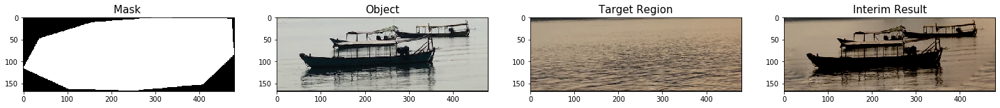

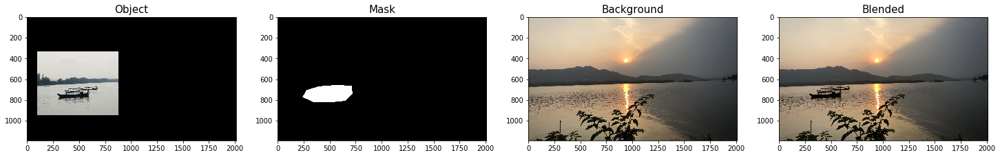

In [19]:
def run_poisson_blend(object_img_path, background_img_path, object_img, object_mask, background_img):
    obj_img_nm = object_img_path.split('/')[1]
    obj_img_nm = obj_img_nm.split('.')[0]
    bg_img_nm = background_img_path.split('/')[1]
    bg_img_nm = bg_img_nm.split('.')[0]

    im_blend_path = os.path.join('my_images/', obj_img_nm + "_" + bg_img_nm + "_poisson_blend.jpg")

    im_blend_rgb, im_blend_bgr = poisson_blend(object_img, object_mask, background_img)

    display_images(4, [ object_img, object_mask, background_img, im_blend_rgb], \
                       ['Object','Mask', 'Background','Blended'],\
                       ['double','double','double','double'])

    cv2.imwrite(im_blend_path, im_blend_bgr)
    
    return (im_blend_path, im_blend_bgr, im_blend_rgb)

img_path, img_bgr, img_rgb = run_poisson_blend(object_img_path, background_img_path, cropped_object, object_mask, background_img)

# Part 3 Mixed Gradients (20 pts)

In [21]:
def mixed_gradient_descent(src_img, mask, trgt_img):
    """
    The implementation for gradient domain processing is not complicated, but it is easy to make a mistake, so let's start with a toy example. Reconstruct this image from its gradient values, plus one pixel intensity. Denote the intensity of the source image at (x, y) as s(x,y) and the value to solve for as v(x,y). For each pixel, then, we have two objectives:
    1. minimize (v(x+1,y)-v(x,y) - max(abs(s(x+1,y)-s(x,y)),abs(t(x+1,y)-t(x,y))))^2
    2. minimize (v(x,y+1)-v(x,y) - max(abs(s(x,y+1)-s(x,y)),abs(t(x,y+1)-t(x,y))))^2
    3. minimize (v(x+1,y)-t(x,y) - max(abs(s(x+1,y)-s(x,y)),abs(t(x+1,y)-t(x,y))))^2
    4. minimize (v(x,y+1)-t(x,y) - max(abs(s(x,y+1)-s(x,y)),abs(t(x,y+1)-t(x,y))))^2
    
    :param im: numpy.ndarray
    """
    im_h, im_w = trgt_img.shape
    
    matrix_size = 2*((im_h)*(im_w-1) + (im_h-1)*(im_w))
    
    #print("Matrix size: ", matrix_size)
        
    A = lil_matrix((matrix_size, im_h * im_w)) 
    b = np.zeros((matrix_size))
    
    im2var = np.arange(im_h * im_w).reshape(im_h, im_w)
    
    e = -1
    
    for y in range(im_h): 
        for x in range(im_w):
            if (x + 1 < im_w):
                e += 1
                A[e, im2var[y][x+1]] = 1
                A[e, im2var[y][x]] = -1
                
                src_gradient = src_img[y][x+1] - src_img[y][x]
                trgt_gradient = trgt_img[y][x+1]- trgt_img[y][x]
                
                if (abs(src_gradient)> abs(trgt_gradient)):
                    b[e] = src_gradient
                else:
                    b[e] = trgt_gradient
             
                if(mask[y][x] == 0):
                    e += 1
                    A[e, im2var[y][x+1]] = -1
                    if (abs(src_gradient)> abs(trgt_gradient)):
                        b[e] = src_gradient - trgt_img[y][x]
                    else:
                        b[e] = trgt_gradient - trgt_img[y][x]
             
            if (y + 1 < im_h):
                e += 1    
                A[e, im2var[y+1][x]] = 1
                A[e, im2var[y][x]] = - 1
                
                src_gradient = src_img[y+1][x] - src_img[y][x]
                trgt_gradient = trgt_img[y+1][x] - trgt_img[y][x]
                
                if(abs(src_gradient) > abs(trgt_gradient)):
                    b[e] = src_gradient
                else:
                    b[e] = trgt_gradient
                 
                if(mask[y][x] == 0):
                    e += 1
                    A[e, im2var[y+1][x]] = -1
                    
                    if(abs(src_gradient) > abs(trgt_gradient)):
                        b[e] = src_gradient - trgt_img[y][x]
                    else:
                        b[e] = trgt_gradient - trgt_img[y][x]
                
    
    var = lsqr(A.tocsr(), b)
    result = var[0].reshape(im_h, im_w)    
    
    return normalize_img(result)


In [22]:
def mix_blend(object_img, object_mask, background_img):
    """
    :param cropped_object: numpy.ndarray One you get from align_source
    :param object_mask: numpy.ndarray One you get from align_source
    :param background_img: numpy.ndarray 
    """

    im_blend_rgb, im_blend_bgr = poisson_blend(object_img, object_mask, background_img, mixed_gradient_descent)

    display_images(4, [ object_img, object_mask, background_img, im_blend_rgb], \
                       ['Object','Mask', 'Background','Blended'],\
                       ['double','double','double','double'])

    obj_img_nm = object_img_path.split('/')[1]
    obj_img_nm = obj_img_nm.split('.')[0]
    bg_img_nm = background_img_path.split('/')[1]
    bg_img_nm = bg_img_nm.split('.')[0]

    im_blend_path = os.path.join('my_images/', obj_img_nm + "_" + bg_img_nm + "_mix_blend.jpg")
    
    cv2.imwrite(im_blend_path, im_blend_bgr)

    return im_blend_rgb, im_blend_bgr

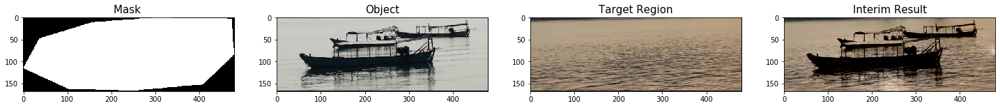

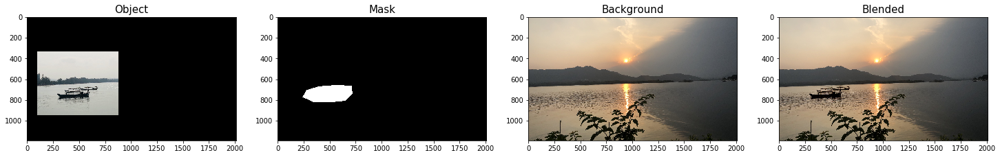

In [23]:
im_blend_rgb, im_blend_bgr = mix_blend(cropped_object, object_mask, background_img)


# Bells & Whistles (Extra Points)

## Color2Gray (20 pts)

In [258]:
def gradient(src_img, trgt_img):
    """
    The implementation for gradient domain processing is not complicated, but it is easy to make a mistake, so let's start with a toy example. Reconstruct this image from its gradient values, plus one pixel intensity. Denote the intensity of the source image at (x, y) as s(x,y) and the value to solve for as v(x,y). For each pixel, then, we have two objectives:
    1. minimize (v(x+1,y)-v(x,y) - max(abs(s(x+1,y)-s(x,y)),abs(t(x+1,y)-t(x,y))))^2
    2. minimize (v(x,y+1)-v(x,y) - max(abs(s(x,y+1)-s(x,y)),abs(t(x,y+1)-t(x,y))))^2
    3. minimize (v(0,0)-s(0,0))^2
    
    :param im: numpy.ndarray
    """
    im_h, im_w = trgt_img.shape
    
    matrix_size = ((im_h)*(im_w-1) + (im_h-1)*(im_w))
        
    A = lil_matrix((matrix_size, im_h * im_w)) 
    b = np.zeros((matrix_size))
    
    im2var = np.arange(im_h * im_w).reshape(im_h, im_w)
    
    e = -1
    A[e, im2var[0][0]] = 1
    b[e] = src_img[0][0]
      
    for y in range(im_h): 
        for x in range(im_w):
            if (x + 1 < im_w):
                e += 1
                A[e, im2var[y][x+1]] = 1
                A[e, im2var[y][x]] = -1
                
                src_gradient = src_img[y][x+1] - src_img[y][x]
                trgt_gradient = trgt_img[y][x+1]- trgt_img[y][x]
                
                if (abs(src_gradient)> abs(trgt_gradient)):
                    b[e] = src_gradient
                else:
                    b[e] = trgt_gradient
             
            if (y + 1 < im_h):
                e += 1    
                A[e, im2var[y+1][x]] = 1
                A[e, im2var[y][x]] = - 1
                
                src_gradient = src_img[y+1][x] - src_img[y][x]
                trgt_gradient = trgt_img[y+1][x] - trgt_img[y][x]
                
                if(abs(src_gradient) > abs(trgt_gradient)):
                    b[e] = src_gradient
                else:
                    b[e] = trgt_gradient
                
    
    var = lsqr(A.tocsr(), b)
    result = var[0].reshape(im_h, im_w)
    
    return result

def color2gray(img):
    im_h, im_w, im_c = img.shape
    
    im_r, im_g, im_b = cv2.split(img)
    
    im_r_max = np.ndarray.max(im_r)
    c1 = im_r_max / (1 + im_r_max)
    
    im_g_max = np.ndarray.max(im_g)
    c2 = im_g_max / (1 + im_g_max)
    
    im_b_max = np.ndarray.max(im_b)
    c3 = im_b_max / (1 + im_b_max)
    
    im_r_adjusted = c1 * im_r
    im_g_adjusted = c2 * im_g
    im_b_adjusted = c3 * im_b
       
    im_iterim = gradient(im_r_adjusted, im_g_adjusted)
    im_iterim2 =  gradient(im_r_adjusted, im_b_adjusted)
    im_gradient =  gradient(im_iterim, im_iterim2)
    
    im_avg = (im_r_adjusted + im_g_adjusted + im_b_adjusted)/3
    
    im_hybrid = 0.75 * im_gradient + 0.25 * im_avg
    im_gray = im_gradient
    
    im_default = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY).astype('double') / 255.0

    display_images(5, [img, im_default, im_avg, im_gray, im_hybrid], \
                   ['Original','CV2 gray','Avg(normalized(RGB))', 'Gradients', 'Hybrid 75(grad):25(avg)', ],\
                   ['uint8','double','double', 'double','double'])
    
    return im_gray
    

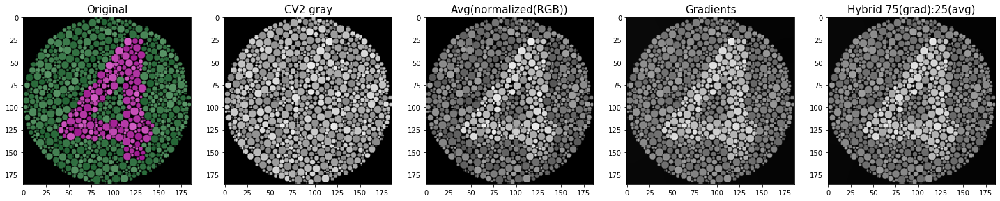

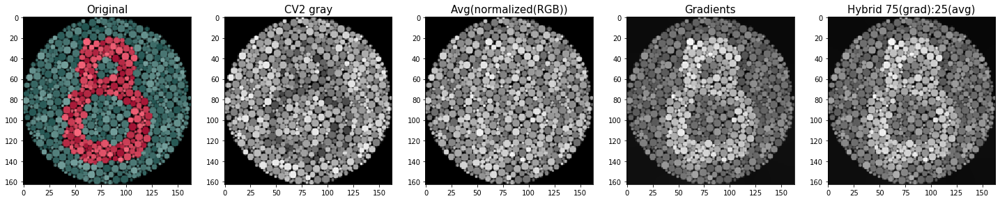

In [23]:
im1 = cv2.cvtColor(cv2.imread('samples/colorBlind4.png'), cv2.COLOR_BGR2RGB)
im1_gray = color2gray(im1)


im2 = cv2.cvtColor(cv2.imread('samples/colorBlind8.png'), cv2.COLOR_BGR2RGB)
im2_gray = color2gray(im2)



## Laplacian pyramid blending (20 pts)

In [254]:
def resize_image(im, new_size):
    
    im_r, im_g, im_b = cv2.split(im)
    
    im_r_resized = cv2.resize(im_r, new_size)
    im_g_resized = cv2.resize(im_g, new_size)
    im_b_resized = cv2.resize(im_b, new_size)
    
    im_resized = cv2.merge((im_r_resized, im_g_resized, im_b_resized))
    
    return im_resized

def laplacian_blend(img1, img2, axis=0):
    
    assert 3 ==  len(img1.shape)
    assert 3 ==  len(img2.shape)
    
    im_h, im_w, im_c = img1.shape
    im_size = (im_w, im_h)
    
    if(img1.size != img2.size):
        print("Resizing Image2 for alignment")
        img2 = resize_image(img2, im_size)
        
    mask_vertical = np.zeros(img1.shape)
    mask_horizontal = np.zeros(img1.shape)
    
    mask = mask_vertical
    
    if (axis == 1):
        mask = mask_horizontal
        
    l0_center_col = int(im_w/2)
    l0_center_row = int(im_h/2)
    
    for c in range(im_c):
        for y in range(l0_center_row):
            for x in range(im_w):
                mask_horizontal[y][x][c] = 1
            
        for y in range(im_h):
            for x in range(l0_center_col):
                mask_vertical[y][x][c] = 1
               
    sharp_blend = mask * img1 + (1 - mask) * img2
    
    display_images(3, [img1, img2, sharp_blend], \
                   ['Image1','Image2','Sharp Blend'],\
                   ['uint8','uint8','uint8',])
    
    img1_l0 = apply_laplacian_filter(img1, 5, 2)
    img2_l0 = apply_laplacian_filter(img2, 5, 2)
    
    blend_l0 = mask * img1_l0 + (1-mask) * img2_l0
    
    display_images(3, [img1_l0, img2_l0, blend_l0], \
                   ['L0 Image1: High pass','L0 Image 2: High pass','L0 Combined'],\
                   ['uint8','uint8','uint8'])
    
    size_l1 = ( int(im_w/2), int(im_h/2))
    
    mask_l1 = apply_gaussian_filter(mask, 5, 20)
    img1_l1 = apply_gaussian_filter(img1, 5, 2)
    img2_l1 = apply_gaussian_filter(img2, 5, 2)
    
    mask_l1 = resize_image(mask, size_l1)
    img1_l1 = resize_image(img1, size_l1)
    img2_l1 = resize_image(img2, size_l1)
    
    size_l2 = ( int(im_w/4), int(im_h/4))
    
    blend_l1 = mask_l1 * img1_l1 + (1-mask_l1) * img2_l1
    
    display_images(3, [img1_l1, img2_l1, blend_l1], \
                   ['L1 Image1','L1 Image2','L1 Combined'],\
                   ['uint8','uint8','uint8',])
    
    blend_l1_2_l0 = resize_image(blend_l1, im_size) 
    blend = blend_l1_2_l0 + blend_l0
    
    display_images(3, [blend_l1_2_l0, blend_l0, blend], \
                   ['L1 Combined: Upsampled','L0 Combined','Combined'],\
                   ['uint8','uint8','uint8',])
    
    
    return blend


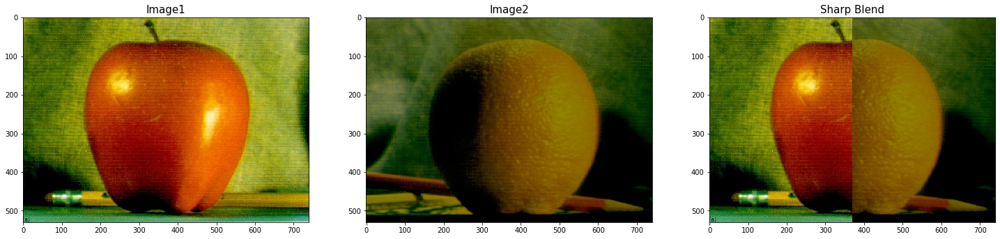

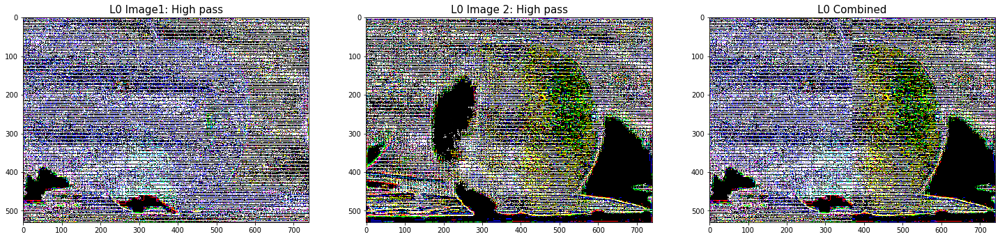

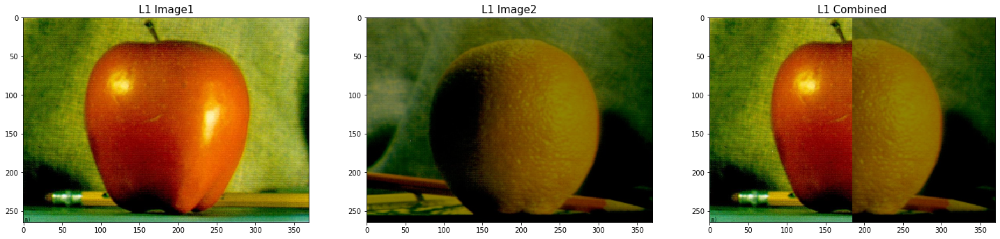

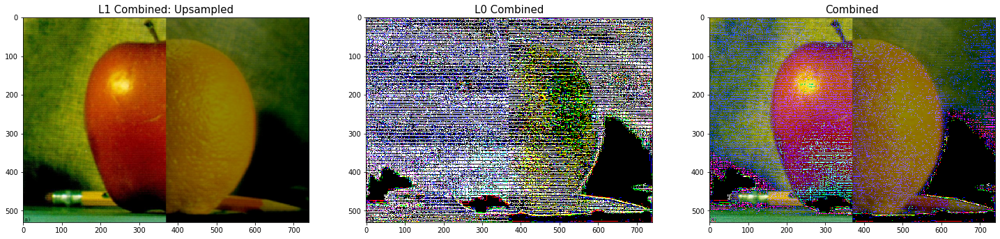

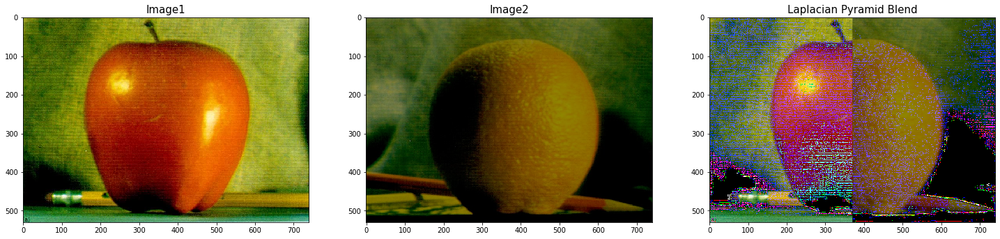

In [255]:
img1 = cv2.cvtColor(cv2.imread("my_images/apple.png"), cv2.COLOR_BGR2RGB)
img2 = cv2.cvtColor(cv2.imread("my_images/orange.png"), cv2.COLOR_BGR2RGB)

img_lap_blend = laplacian_blend(img1, img2)

display_images(3, [img1, img2, img_lap_blend], ['Image1','Image2','Laplacian Pyramid Blend'],['uint8','uint8','uint8'])


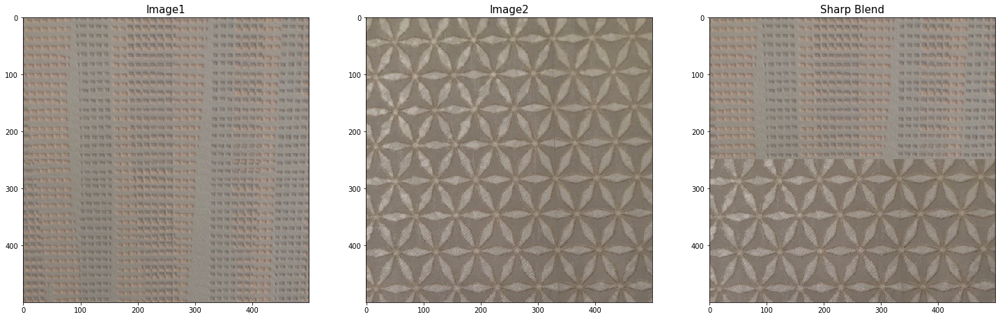

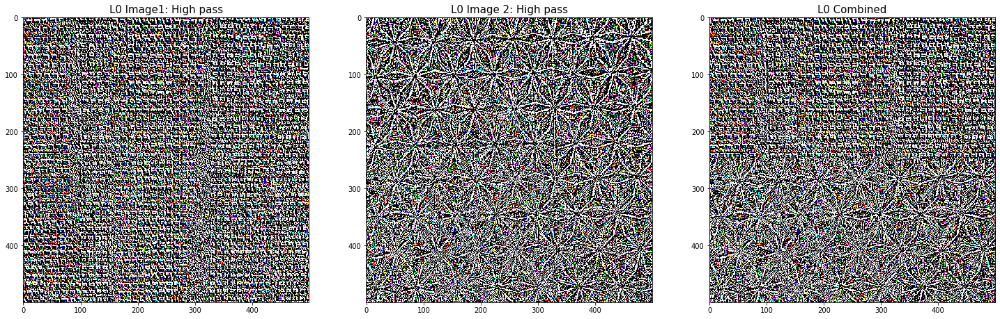

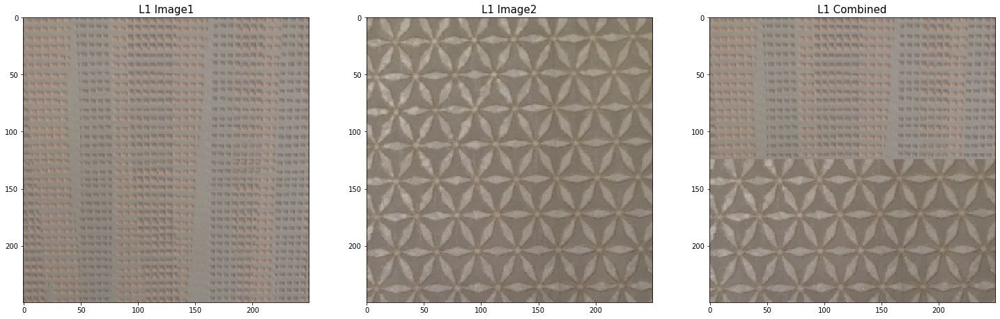

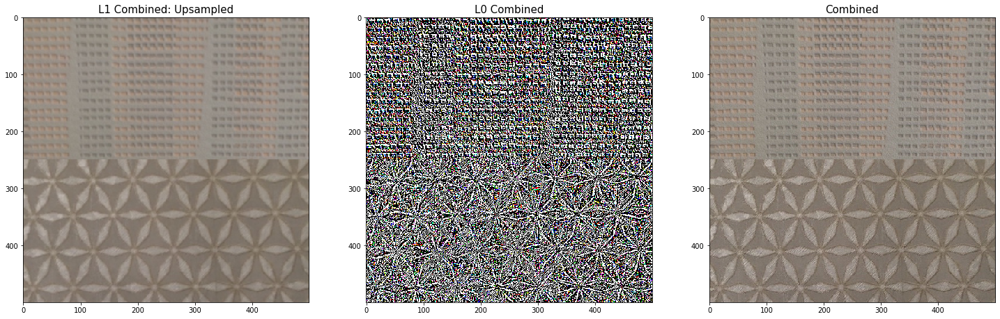

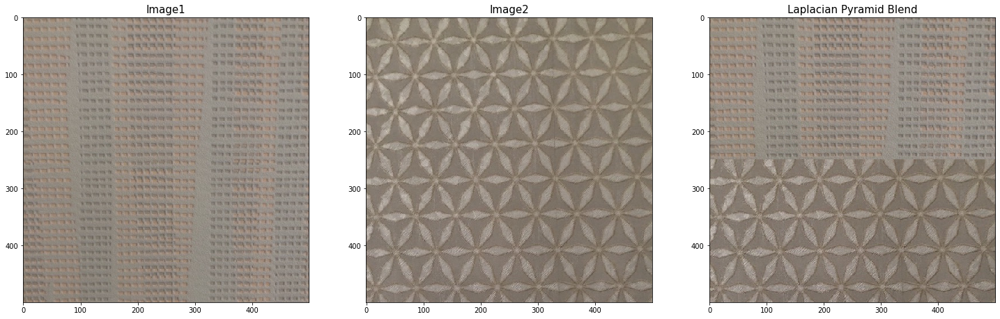

In [256]:
img1 = cv2.cvtColor(cv2.imread("my_images/TexturedWall-1.jpg"), cv2.COLOR_BGR2RGB)
img2 = cv2.cvtColor(cv2.imread("my_images/TexturedWall-2.jpg"), cv2.COLOR_BGR2RGB)

img_lap_blend = laplacian_blend(img1, img2,1)

display_images(3, [img1, img2, img_lap_blend], ['Image1','Image2','Laplacian Pyramid Blend'],['uint8','uint8','uint8'])

## More gradient domain processing (up to 20 pts)